<a href="https://colab.research.google.com/github/SAMashiyane/ANN_Salary/blob/main/challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Fri Jan  7 08:10:50 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    29W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# challenge

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import glob
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader,Dataset
from torchvision.models import resnet18, resnet34 ,resnet50
import os

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch
use_gpu = torch.cuda.is_available()

In [ ]:
use_gpu

True

## Data

- train: learning the **parameters** of the model.
- valid: learning **hyper-parameters**.
- test
- development

In [ ]:
# DATA_DIR ="C:/Users/Salio/Desktop/recognition-challenge/"
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
#  !unzip "/content/gdrive/MyDrive/recognition.zip" -d "/content/challenge"

In [ ]:
DATA_DIR = "/content/challenge/recognition/datasets"

In [ ]:
os.listdir(DATA_DIR)

['valid', 'trains']

In [ ]:
trn_dir = "/content/challenge/recognition/datasets/trains"
val_dir = "/content/challenge/recognition/datasets/valid"

In [ ]:
#  os.listdir(trn_dir)

In [ ]:
trn_fnames = glob.glob(f'{trn_dir}/*/*/*.JPEG')
trn_fnames[:5]

['/content/challenge/recognition/datasets/trains/n01950731/images/n01950731_35.JPEG',
 '/content/challenge/recognition/datasets/trains/n01950731/images/n01950731_341.JPEG',
 '/content/challenge/recognition/datasets/trains/n01950731/images/n01950731_9.JPEG',
 '/content/challenge/recognition/datasets/trains/n01950731/images/n01950731_419.JPEG',
 '/content/challenge/recognition/datasets/trains/n01950731/images/n01950731_17.JPEG']

(64, 64, 3)

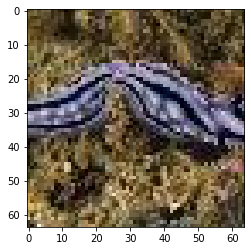

In [ ]:
img = plt.imread(trn_fnames[9])
plt.imshow(img);
img.shape

### Datasets and Dataloaders in PyTorch

In [ ]:
# load folder image 
# imagesVal_folder='/content/challenge/recognition-challenge/val/images/'

In [ ]:
# convert txt file to cvs 
# dataframe = pd.read_csv("/content/challenge/recognition-challenge/val/val_annotations.txt",header= None,sep='\s+')

In [ ]:
# adding column headings (ID and classes)
# dataframe.columns = ['ID_image','classes']

In [ ]:
# dataframe.to_csv('val.csv' ,index = True)


In [ ]:
# df = dataframe

In [ ]:
# df['id'] = df.index.astype(str)


In [ ]:
# df.shape

In [ ]:
# image_names=df[:]['id']
# image_names


In [ ]:
# 'val_'+image_names.iloc[19]+'.JPEG'

In [ ]:
# find image by ID in folder images
# image_names=df[:]['id']
# image_names.iloc[5]
# image=cv2.imread(imagesVal_folder+'val_'+image_names.iloc[5]+'.JPEG')
# image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
# plt.imshow(image)
# type(image)
# image = image.view(1, -1)
# im = image.view(-1, 64, 64, 3)
# im.shape

In [ ]:
# np.array(dataframe.drop(['id','ID_image'], axis=1))

In [ ]:
# make customer dataset for only valid::)) 
# class ImageDataset(Dataset):
    
#     def __init__(self,dataframe,img_folder,transform):
#         self.dataframe=dataframe
#         self.transform=transform
        
#         self.img_folder=img_folder

#         self.image_names=self.dataframe[:]['id']
#         self.labels=np.array(self.dataframe.drop(['id','ID_image'], axis=1))
        
        
#     def __len__(self):
#         return len(self.image_names)
    
    
#     def __getitem__(self,index):
        
#         image=cv2.imread(self.img_folder+'val_'+self.image_names.iloc[index]+'.JPEG')
#         image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        
#         image=self.transform(image)
        
        
#         targets=self.labels[index]
        
#         targets = self.transform( targets)

#         return image,targets

In [ ]:
train_ds = datasets.ImageFolder(trn_dir)
valid_ds = datasets.ImageFolder(val_dir)

In [ ]:
# valid_ds.classes

In [ ]:
# train_ds.classes

In [ ]:
#  valid_ds.class_to_idx

In [ ]:
#  train_ds.class_to_idx

In [ ]:
# train_ds.root

In [ ]:
# train_ds.imgs

### Transformations

In [ ]:
# image size = 64 * 64 
transform_train = transforms.Compose([
    # transforms.RandomCrop(32, padding=4),  # PIL Image
    transforms.RandomHorizontalFlip(),   # PIL Image
    transforms.ToTensor(), #  # Tensor
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_valid = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])


In [ ]:
train_ds = datasets.ImageFolder(trn_dir, transform=transform_train)
valid_ds = datasets.ImageFolder(val_dir, transform=transform_valid)

# valid_ds=ImageDataset(df,imagesVal_folder,transform_valid)

In [ ]:
len(train_ds), len(valid_ds)

(100000, 10000)

#### Dataloaders

In [ ]:
batch_size =128


train_dl = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, 
                                       shuffle=True, num_workers=2)
valid_dl = torch.utils.data.DataLoader(valid_ds, batch_size=batch_size, 
                                       shuffle=True, num_workers=2)
print(len(train_dl))
print(len(train_ds)//batch_size)

782
781


In [ ]:
batch = next(iter(train_dl))
train_data = batch[0]
print(train_data.shape)

torch.Size([128, 3, 64, 64])


In [ ]:
batch_valid = next(iter(valid_dl))
batch_valid_data = batch_valid[0]
print(batch_valid_data.shape)

torch.Size([128, 3, 64, 64])


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)
        
        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

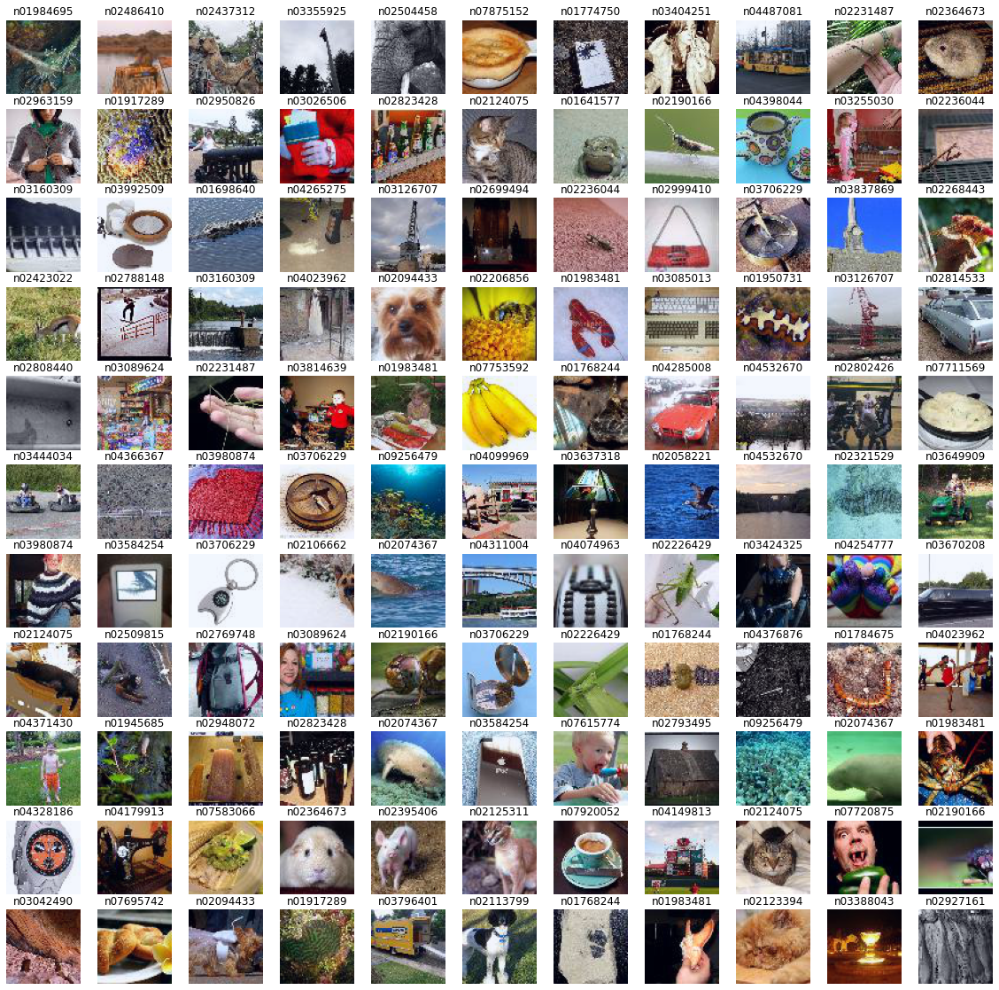

In [ ]:
classes = train_ds.classes
# print(classes)

plot_images(batch[0], batch[1], classes,normalize=True)

In [ ]:
# inputs, targets = next(iter(train_dl))
# out = torchvision.utils.make_grid(inputs, padding=3)
# plt.figure(figsize=(16, 12))
# plt.imshow(out)

In [ ]:
net = resnet50()
# net1 = resnet18()
# net.fc = nn.Linear(512, 200)
net.fc = nn.Linear(2048,200)
net = net.to(device)

In [ ]:
# net1

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
 net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [ ]:
count_parameters(net)

23.917832

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9)#, weight_decay=5e-4)

In [ ]:
y = net(batch[0].to(device))
y.shape

torch.Size([128, 200])

In [ ]:
batch[1].shape

torch.Size([128])

In [ ]:
criterion(y, batch[1].to(device))

tensor(5.6245, device='cuda:0', grad_fn=<NllLossBackward0>)

In [ ]:
# FOUND_LR = 1e-3

# params = [
#           {'params': net.conv1.parameters(), 'lr': FOUND_LR / 10},
#           {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
#           {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
#           {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
#           {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
#           {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
#           {'params': model.fc.parameters()}
#          ]


# optimizer = optim.Adam(params, lr = FOUND_LR)

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [ ]:
try:
    from google import colab
    COLAB_ENV = True
except (ImportError, ModuleNotFoundError):
    COLAB_ENV = False

# Load the TensorBoard notebook extension
if COLAB_ENV:
    %load_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

<IPython.core.display.Javascript object>

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
pip install torchmetrics

In [ ]:
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('dataset-ResNet')

In [ ]:
import time
# time.clock_gettime()

In [ ]:
import sys
import torchmetrics
import logging
logger = logging.getLogger('dataset')
# writer = SummaryWriter('runs/cifar100_resnet18')
writer = SummaryWriter()

In [ ]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy().cuda()
    for batch_idx, (inputs, targets) in enumerate(train_dl):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 5:
        #     break
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    print(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
    

def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy().cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(valid_dl):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        print(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), 'ckpt', epoch=epoch)


class Checkpoint(object):
    def __init__(self):
        self.best_acc = 0.
        self.folder = 'chekpoint'
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, filename, epoch=-1):
        if acc > best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), filename + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [ ]:
# checkpoint = Checkpoint()
# start, end = 0,30
# for epoch in range(start, end):
#     train(epoch)

# writer.close()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9, weight_decay=5e-4)

In [ ]:
writer = SummaryWriter('/content/runs/Jan07_08-15-25_dece26fa5b3e')
checkpoint = Checkpoint()
start, end = 30, 60
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

Train: Epoch:30 Loss:2.275 Accuracy:0.4429
Test:  Epoch:30 Loss:3.062 Accuracy:0.3123

Train: Epoch:31 Loss:2.264 Accuracy:0.4438
Test:  Epoch:31 Loss:2.953 Accuracy:0.3261

Train: Epoch:32 Loss:2.261 Accuracy:0.4446
Test:  Epoch:32 Loss:2.946 Accuracy:0.3229

Train: Epoch:33 Loss:2.249 Accuracy:0.4453
Test:  Epoch:33 Loss:2.911 Accuracy:0.3327

Train: Epoch:34 Loss:2.241 Accuracy:0.447
Test:  Epoch:34 Loss:2.943 Accuracy:0.3285

Train: Epoch:35 Loss:2.234 Accuracy:0.4497
Test:  Epoch:35 Loss:3.179 Accuracy:0.3026

Train: Epoch:36 Loss:2.225 Accuracy:0.4511
Test:  Epoch:36 Loss:2.961 Accuracy:0.3146

Train: Epoch:37 Loss:2.218 Accuracy:0.4519
Test:  Epoch:37 Loss:3.01 Accuracy:0.32

Train: Epoch:38 Loss:2.216 Accuracy:0.4548
Test:  Epoch:38 Loss:3.257 Accuracy:0.2817

Train: Epoch:39 Loss:2.209 Accuracy:0.4551
Test:  Epoch:39 Loss:2.978 Accuracy:0.3269

Train: Epoch:40 Loss:2.209 Accuracy:0.4557
Test:  Epoch:40 Loss:2.972 Accuracy:0.3265

Train: Epoch:41 Loss:2.191 Accuracy:0.4591
Test

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

INFO:root:
Unfortunately, your original traceback can not be constructed.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-37-e6f979fffa05>", line 5, in <module>
    train(epoch)
  File "<ipython-input-34-b9faf6ca54d0>", line 12, in train
    optimizer.step()
  File "/usr/local/lib/python3.7/dist-packages/torch/optim/optimizer.py", line 88, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/torch/autograd/grad_mode.py", line 28, in decorate_context
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/torch/optim/sgd.py", line 143, in step
    nesterov=nesterov)
  File "/usr/local/lib/python3.7/dist-packages/torch/optim/_functional.py", line 164, in sgd
    d_p = d_p.add(param, alpha=weight_decay)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/u

KeyboardInterrupt: ignored